In [2]:
# Install required libraries
%pip install torch torchvision opencv-python pillow numpy scikit-learn seaborn matplotlib grad-cam

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Import libraries
import os
import random
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import cv2

# Grad-CAM imports
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [4]:
# Define dataset paths for local data

real_dataset_path = Path(r"D:\Projects\dataset\real")
fake_dataset_path = Path(r"D:\Projects\dataset\fake")

Total real images found: 2000
Total fake images found: 2000

Displaying sample real images:


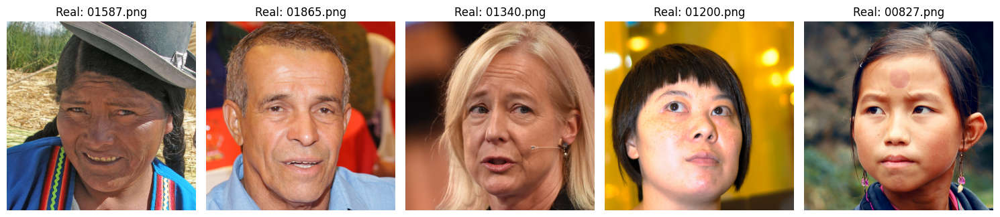


Displaying sample fake images:


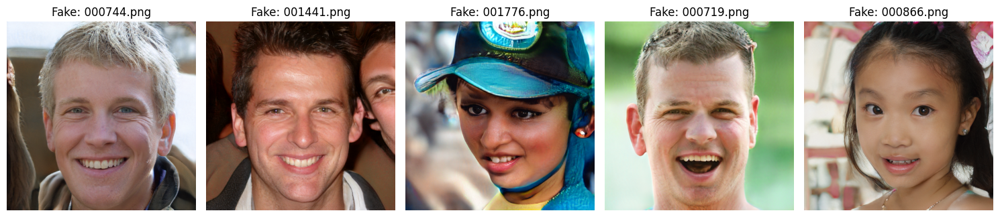

In [5]:
# Supported image formats
image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff', '.webp')

# Function to get all image files from a directory
def get_image_files(directory_path):
    try:
        files = os.listdir(directory_path)
        image_files = [
            os.path.join(directory_path, f) 
            for f in files 
            if f.lower().endswith(image_extensions)
        ]
        return image_files
    except FileNotFoundError:
        print(f"Directory not found: {directory_path}")
        return []
    except PermissionError:
        print(f"Permission denied accessing: {directory_path}")
        return []

# Get all image files
real_images = get_image_files(real_dataset_path)
fake_images = get_image_files(fake_dataset_path)

print(f"Total real images found: {len(real_images)}")
print(f"Total fake images found: {len(fake_images)}")

if len(real_images) == 0:
    print("Warning: No real images found!")
if len(fake_images) == 0:
    print("Warning: No fake images found!")

# Function to display images safely
def display_images(image_list, title_prefix, max_images=5):
    """Display sample images with error handling"""
    if not image_list:
        print(f"No {title_prefix.lower()} images to display")
        return
    
    # Sample images (up to max_images)
    sample_images = random.sample(image_list, min(max_images, len(image_list)))
    
    plt.figure(figsize=(15, 5))
    for i, image_path in enumerate(sample_images):
        try:
            image = Image.open(image_path)
            plt.subplot(1, len(sample_images), i + 1)
            plt.imshow(image)
            plt.axis('off')
            plt.title(f"{title_prefix}: {os.path.basename(image_path)}")
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            continue
    
    plt.tight_layout()
    plt.show()

# Display sample real images
print("\nDisplaying sample real images:")
display_images(real_images, "Real")

# Display sample fake images
print("\nDisplaying sample fake images:")
display_images(fake_images, "Fake")

In [6]:
# Balance the dataset
num_target_images = 2000

# Check real images
if len(real_images) < num_target_images:
    print(f"Warning: Only {len(real_images)} real images available, expected {num_target_images}.")
    selected_real_images = real_images
elif len(real_images) > num_target_images:
    print(f"More real images available ({len(real_images)}), randomly selecting {num_target_images}.")
    selected_real_images = random.sample(real_images, num_target_images)
else:
    print(f"Perfect! Using all {len(real_images)} real images.")
    selected_real_images = real_images

# Check fake images
if len(fake_images) < num_target_images:
    print(f"Warning: Only {len(fake_images)} fake images available, expected {num_target_images}.")
    selected_fake_images = fake_images
elif len(fake_images) > num_target_images:
    print(f"More fake images available ({len(fake_images)}), randomly selecting {num_target_images}.")
    selected_fake_images = random.sample(fake_images, num_target_images)
else:
    print(f"Perfect! Using all {len(fake_images)} fake images.")
    selected_fake_images = fake_images

# Print final dataset composition
print(f"\nFinal dataset composition:")
print(f"Real images: {len(selected_real_images)}")
print(f"Fake images: {len(selected_fake_images)}")
print(f"Total images: {len(selected_real_images) + len(selected_fake_images)}")

# Define custom dataset for real and fake images
class DeepfakeDataset(Dataset):
    def __init__(self, real_images, fake_images, transform=None):
        self.real_images = real_images
        self.fake_images = fake_images
        self.transform = transform
        # Create image list and labels (0 for real, 1 for fake)
        self.all_images = real_images + fake_images
        self.labels = [0] * len(real_images) + [1] * len(fake_images)
        # List to store indices of valid images
        self.valid_indices = []
        self.corrupted_files = []

        # Check for valid images during initialization
        print("Checking image validity...")
        for idx in range(len(self.all_images)):
            try:
                img_path = self.all_images[idx]
                with Image.open(img_path) as image:
                    image.convert('RGB')  # Test conversion
                self.valid_indices.append(idx)
            except Exception as e:
                self.corrupted_files.append((img_path, str(e)))

        print(f"Total images: {len(self.all_images)}")
        print(f"Valid images: {len(self.valid_indices)}")
        if self.corrupted_files:
            print(f"Corrupted files found: {len(self.corrupted_files)}")
            for file_path, error in self.corrupted_files[:5]:  # Show first 5 corrupted files
                print(f"  - {file_path}: {error}")
            if len(self.corrupted_files) > 5:
                print(f"  ... and {len(self.corrupted_files) - 5} more")

    def __len__(self):
        return len(self.valid_indices)

    def __getitem__(self, idx):
        # Map to valid index
        valid_idx = self.valid_indices[idx]
        img_path = self.all_images[valid_idx]
        label = self.labels[valid_idx]
        
        try:
            with Image.open(img_path) as image:
                image = image.convert('RGB')
                if self.transform:
                    image = self.transform(image)
                return image, label
        except Exception as e:
            # This should not happen due to pre-checking, but included as a safeguard
            print(f"Error loading image {img_path}: {e}")
            # Return a black image as fallback
            if self.transform:
                black_image = Image.new('RGB', (224, 224), color='black')
                return self.transform(black_image), label
            return None, None

# Define image transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # ResNet expects 224x224 images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
])

# Create dataset with balanced images
dataset = DeepfakeDataset(selected_real_images, selected_fake_images, transform=transform)

# Split into train and test sets (80% train, 20% test)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

print(f"\nDataset split:")
print(f"Training set size: {len(train_dataset)}")
print(f"Test set size: {len(test_dataset)}")

# Create data loaders with custom collate function to handle None values
def custom_collate(batch):
    # Filter out None items
    batch = [item for item in batch if item[0] is not None]
    if len(batch) == 0:
        return torch.tensor([]), torch.tensor([])
    return torch.utils.data.dataloader.default_collate(batch)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, collate_fn=custom_collate)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, collate_fn=custom_collate)

print(f"\nData loaders created:")
print(f"Training batches: {len(train_loader)}")
print(f"Test batches: {len(test_loader)}")

# Verify class balance in dataset
real_count = sum(1 for _, label in dataset if label == 0)
fake_count = sum(1 for _, label in dataset if label == 1)
print(f"\nClass distribution in final dataset:")
print(f"Real images (label 0): {real_count}")
print(f"Fake images (label 1): {fake_count}")
print(f"Balance ratio: {real_count/fake_count:.3f}")

Perfect! Using all 2000 real images.
Perfect! Using all 2000 fake images.

Final dataset composition:
Real images: 2000
Fake images: 2000
Total images: 4000
Checking image validity...
Total images: 4000
Valid images: 4000

Dataset split:
Training set size: 3200
Test set size: 800

Data loaders created:
Training batches: 100
Test batches: 25

Class distribution in final dataset:
Real images (label 0): 2000
Fake images (label 1): 2000
Balance ratio: 1.000


In [7]:
# Define the ConvNeXt-based classifier
class DeepfakeClassifier(nn.Module):
    def __init__(self):
        super(DeepfakeClassifier, self).__init__()
        # Load pretrained ConvNeXt-Tiny
        self.convnext = models.convnext_tiny(weights='IMAGENET1K_V1')
        # Store the features layer for Grad-CAM
        self.features = self.convnext.features
        # Store the classifier layers
        self.avgpool = self.convnext.avgpool
        self.classifier = self.convnext.classifier
        
        # Modify the final classifier layer for binary classification
        num_ftrs = self.classifier[2].in_features
        self.classifier[2] = nn.Linear(num_ftrs, 1)

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = self.classifier(x)
        return x

# Initialize model, loss function, and optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DeepfakeClassifier().to(device)
criterion = nn.BCEWithLogitsLoss()  # Binary cross-entropy with logits
optimizer = optim.Adam(model.parameters(), lr=0.0001)  # Lower LR for ConvNeXt

Epoch [1/10], Train Loss: 0.2284, Val Loss: 0.0156
Epoch [2/10], Train Loss: 0.0256, Val Loss: 0.0081
Epoch [3/10], Train Loss: 0.0040, Val Loss: 0.0084
Epoch [4/10], Train Loss: 0.0297, Val Loss: 0.0086
Epoch [5/10], Train Loss: 0.0077, Val Loss: 0.0178
Epoch [6/10], Train Loss: 0.0081, Val Loss: 0.0090
Epoch [7/10], Train Loss: 0.0098, Val Loss: 0.0023
Epoch [8/10], Train Loss: 0.0095, Val Loss: 0.0067
Epoch [9/10], Train Loss: 0.0079, Val Loss: 0.0142
Epoch [10/10], Train Loss: 0.0046, Val Loss: 0.0097


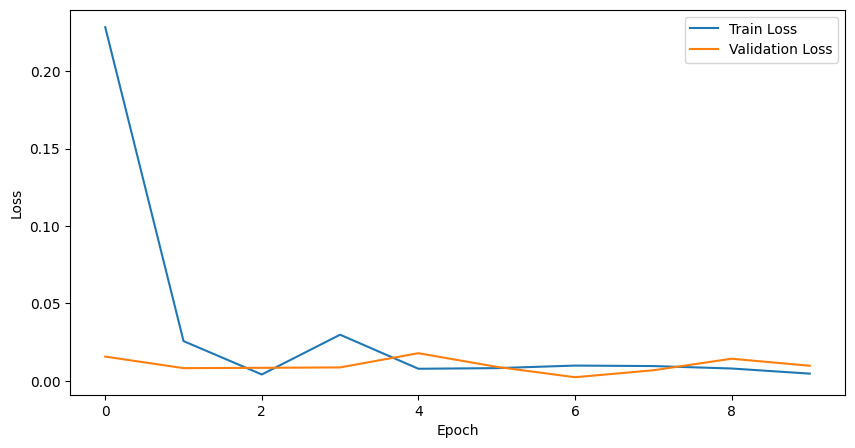

In [8]:
# Training loop
num_epochs = 10
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    # Training phase
    model.train()
    running_loss = 0.0
    total_samples = 0
    for images, labels in train_loader:
        # Skip empty batches
        if images.size(0) == 0:
            continue
        images, labels = images.to(device), labels.to(device).float().unsqueeze(1)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        total_samples += images.size(0)
    epoch_loss = running_loss / total_samples if total_samples > 0 else float('inf')
    train_losses.append(epoch_loss)

    # Validation phase
    model.eval()
    val_loss = 0.0
    total_val_samples = 0
    with torch.no_grad():
        for images, labels in test_loader:
            # Skip empty batches
            if images.size(0) == 0:
                continue
            images, labels = images.to(device), labels.to(device).float().unsqueeze(1)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            total_val_samples += images.size(0)
    val_epoch_loss = val_loss / total_val_samples if total_val_samples > 0 else float('inf')
    val_losses.append(val_epoch_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_loss:.4f}, Val Loss: {val_epoch_loss:.4f}")

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [9]:
# Evaluate the model on the test set
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device).float().unsqueeze(1)
        outputs = model(images)
        predicted = (torch.sigmoid(outputs) > 0.5).float()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = 100 * correct / total
print(f"Test Accuracy: {accuracy:.2f}%")

Test Accuracy: 99.75%


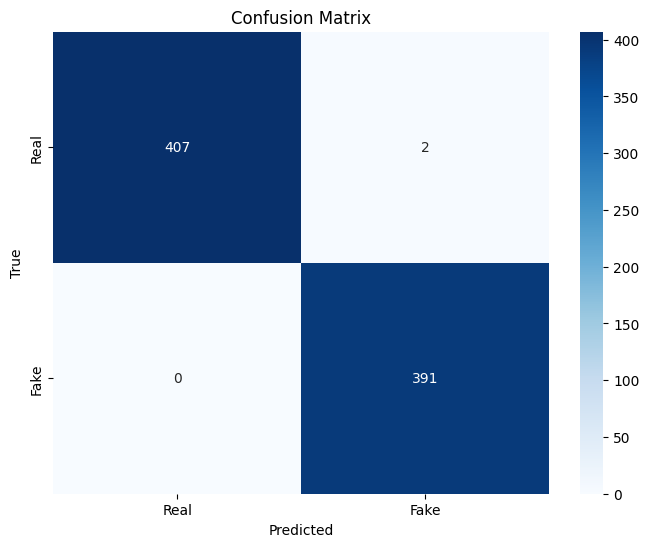

Confusion Matrix:
True Negatives (Real as Real): 407
False Positives (Real as Fake): 2
False Negatives (Fake as Real): 0
True Positives (Fake as Fake): 391


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Evaluate the model on the test set to compute confusion matrix
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        # Skip empty batches
        if images.size(0) == 0:
            continue
        images, labels = images.to(device), labels.to(device).float().unsqueeze(1)
        outputs = model(images)
        predicted = (torch.sigmoid(outputs) > 0.5).float().squeeze().cpu().numpy()
        all_preds.extend(predicted)
        all_labels.extend(labels.squeeze().cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Real', 'Fake'], yticklabels=['Real', 'Fake'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Print confusion matrix values
print("Confusion Matrix:")
print(f"True Negatives (Real as Real): {cm[0, 0]}")
print(f"False Positives (Real as Fake): {cm[0, 1]}")
print(f"False Negatives (Fake as Real): {cm[1, 0]}")
print(f"True Positives (Fake as Fake): {cm[1, 1]}")

In [11]:
# GRAD-CAM IMPLEMENTATION
class GradCAMWrapper:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.cam = GradCAM(model=model, target_layers=[target_layer])
    
    def generate_cam(self, input_tensor, class_idx=None):
        """Generate CAM for the input tensor"""
        # For binary classification, we use BinaryClassifierOutputTarget
        if class_idx is None:
            # Let the model decide based on its prediction
            targets = None
        else:
            targets = [BinaryClassifierOutputTarget(class_idx)]
        
        # Generate the CAM
        grayscale_cam = self.cam(input_tensor=input_tensor, targets=targets)
        return grayscale_cam[0]  # Return the first (and only) CAM
    
    def visualize_cam(self, original_image, input_tensor, class_idx=None, alpha=0.4):
        """Visualize CAM overlay on original image"""
        # Generate CAM
        grayscale_cam = self.generate_cam(input_tensor, class_idx)
        
        # Convert original image to numpy array and ensure it's 224x224
        if isinstance(original_image, torch.Tensor):
            # Denormalize the image
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            original_image = original_image.squeeze().permute(1, 2, 0).cpu().numpy()
            original_image = original_image * std + mean
            original_image = np.clip(original_image, 0, 1)
        elif isinstance(original_image, np.ndarray):
            original_image = original_image / 255.0 if original_image.max() > 1 else original_image
            # Resize original image to match CAM size (224x224)
            if original_image.shape[:2] != (224, 224):
                original_image = cv2.resize(original_image, (224, 224))
        
        # Ensure grayscale_cam is the right size
        if grayscale_cam.shape != (224, 224):
            grayscale_cam = cv2.resize(grayscale_cam, (224, 224))
        
        # Create visualization
        visualization = show_cam_on_image(original_image, grayscale_cam, use_rgb=True, colormap=cv2.COLORMAP_JET)
        
        return visualization, grayscale_cam

In [12]:
# Initialize Grad-CAM (using the last convolutional layer)
target_layer = model.features[-1]  # Last layer of the feature extractor
gradcam_wrapper = GradCAMWrapper(model, target_layer)

# Function to analyze single image with Grad-CAM
def analyze_image_with_gradcam(image_path, model, gradcam_wrapper, transform):
    """Analyze a single image and generate Grad-CAM visualization"""
    # Load and preprocess image
    original_image = Image.open(image_path).convert('RGB')
    
    # Resize original image to 224x224 for consistent visualization
    original_image_resized = original_image.resize((224, 224), Image.LANCZOS)
    original_image_np = np.array(original_image_resized) / 255.0
    
    # Apply transforms for model input
    input_tensor = transform(original_image).unsqueeze(0).to(device)
    
    # Make prediction
    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
        probability = torch.sigmoid(output).item()
        predicted_class = 1 if probability > 0.5 else 0
        confidence = probability if predicted_class == 1 else 1 - probability
    
    # Generate Grad-CAM for the predicted class
    cam_visualization, grayscale_cam = gradcam_wrapper.visualize_cam(
        original_image_np, input_tensor, class_idx=predicted_class
    )
    
    return {
        'original_image': original_image_np,
        'cam_visualization': cam_visualization,
        'grayscale_cam': grayscale_cam,
        'prediction': 'FAKE' if predicted_class == 1 else 'REAL',
        'confidence': confidence,
        'probability': probability
    }

In [13]:
# Analyze sample images with Grad-CAM
def visualize_gradcam_samples(real_images, fake_images, model, gradcam_wrapper, transform, num_samples=3):
    """Visualize Grad-CAM for sample real and fake images"""
    # Sample images
    sample_real = random.sample(real_images, min(num_samples, len(real_images)))
    sample_fake = random.sample(fake_images, min(num_samples, len(fake_images)))
    
    all_samples = [(img, 'REAL') for img in sample_real] + [(img, 'FAKE') for img in sample_fake]
    
    fig, axes = plt.subplots(len(all_samples), 3, figsize=(15, 5 * len(all_samples)))
    if len(all_samples) == 1:
        axes = axes.reshape(1, -1)
    
    for idx, (image_path, true_label) in enumerate(all_samples):
        try:
            # Analyze image
            result = analyze_image_with_gradcam(image_path, model, gradcam_wrapper, transform)
            
            # Plot original image
            axes[idx, 0].imshow(result['original_image'])
            axes[idx, 0].set_title(f'Original\nTrue: {true_label}')
            axes[idx, 0].axis('off')
            
            # Plot Grad-CAM heatmap
            axes[idx, 1].imshow(result['grayscale_cam'], cmap='jet')
            axes[idx, 1].set_title(f'Grad-CAM Heatmap\nFocus Areas')
            axes[idx, 1].axis('off')
            
            # Plot overlay
            axes[idx, 2].imshow(result['cam_visualization'])
            axes[idx, 2].set_title(f'Overlay\nPred: {result["prediction"]} ({result["confidence"]:.2%})')
            axes[idx, 2].axis('off')
            
        except Exception as e:
            print(f"Error processing {image_path}: {e}")
            for j in range(3):
                axes[idx, j].text(0.5, 0.5, f'Error: {str(e)[:50]}...', 
                                ha='center', va='center', transform=axes[idx, j].transAxes)
                axes[idx, j].axis('off')
    
    plt.tight_layout()
    plt.show()

Generating Grad-CAM visualizations...


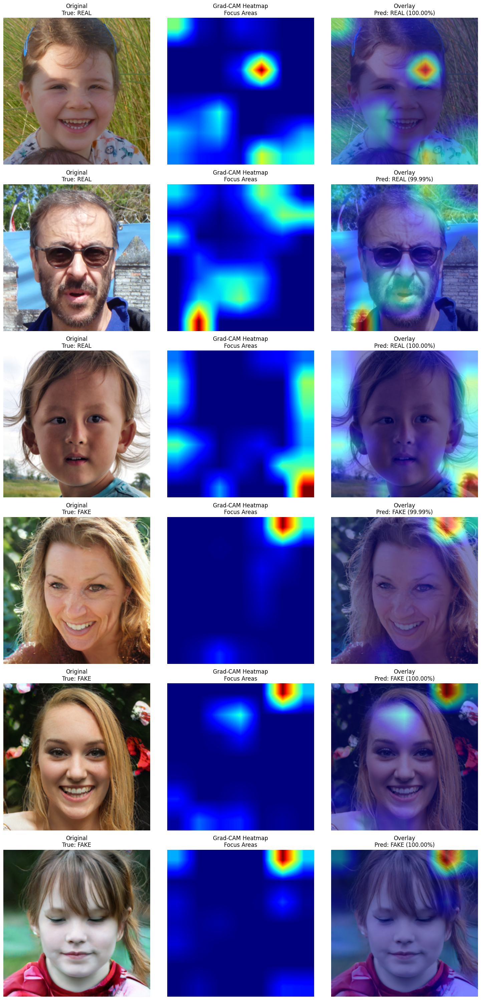

In [14]:
# Visualize Grad-CAM samples
print("Generating Grad-CAM visualizations...")
visualize_gradcam_samples(selected_real_images, fake_images, model, gradcam_wrapper, transform, num_samples=3)

In [15]:
# Function to analyze test set images with Grad-CAM
def analyze_test_predictions_with_gradcam(test_loader, model, gradcam_wrapper, num_samples=6):
    """Analyze test set predictions with Grad-CAM visualizations"""
    model.eval()
    sample_count = 0
    results = []
    
    # Collect sample images from test set
    for images, labels in test_loader:
        if sample_count >= num_samples:
            break
            
        images, labels = images.to(device), labels.to(device).float()
        
        with torch.no_grad():
            outputs = model(images)
            predictions = torch.sigmoid(outputs)
        
        # Process each image in the batch
        for i in range(images.size(0)):
            if sample_count >= num_samples:
                break
                
            single_image = images[i:i+1]  # Keep batch dimension
            true_label = labels[i].item()
            pred_prob = predictions[i].item()
            pred_class = 1 if pred_prob > 0.5 else 0
            
            # Generate Grad-CAM
            grayscale_cam = gradcam_wrapper.generate_cam(single_image, class_idx=pred_class)
            
            # Denormalize image for visualization
            img_for_vis = single_image.squeeze().cpu()
            mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
            std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
            img_for_vis = img_for_vis * std + mean
            img_for_vis = torch.clamp(img_for_vis, 0, 1)
            img_for_vis = img_for_vis.permute(1, 2, 0).numpy()
            
            # Create overlay
            cam_visualization = show_cam_on_image(img_for_vis, grayscale_cam, use_rgb=True)
            
            results.append({
                'original': img_for_vis,
                'cam_heatmap': grayscale_cam,
                'cam_overlay': cam_visualization,
                'true_label': 'FAKE' if true_label == 1 else 'REAL',
                'pred_label': 'FAKE' if pred_class == 1 else 'REAL',
                'confidence': pred_prob if pred_class == 1 else 1 - pred_prob,
                'correct': true_label == pred_class
            })
            sample_count += 1
    
    return results

In [16]:
# Analyze test predictions with Grad-CAM
print("Analyzing test predictions with Grad-CAM...")
test_results = analyze_test_predictions_with_gradcam(test_loader, model, gradcam_wrapper, num_samples=6)

Analyzing test predictions with Grad-CAM...


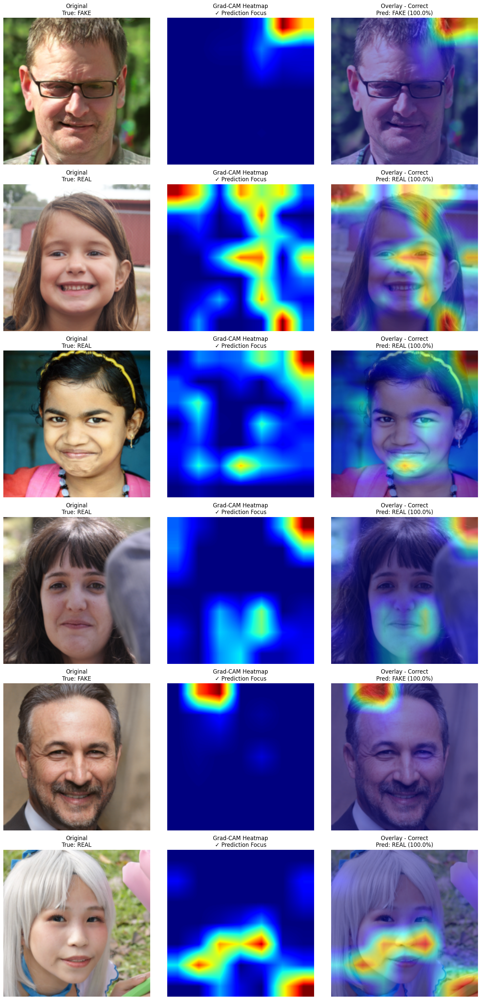

In [17]:
# Visualize test results
fig, axes = plt.subplots(len(test_results), 3, figsize=(15, 5 * len(test_results)))
if len(test_results) == 1:
    axes = axes.reshape(1, -1)

for idx, result in enumerate(test_results):
    # Original image
    axes[idx, 0].imshow(result['original'])
    axes[idx, 0].set_title(f'Original\nTrue: {result["true_label"]}')
    axes[idx, 0].axis('off')
    
    # Grad-CAM heatmap
    axes[idx, 1].imshow(result['cam_heatmap'], cmap='jet')
    axes[idx, 1].set_title(f'Grad-CAM Heatmap\n{"✓" if result["correct"] else "✗"} Prediction Focus')
    axes[idx, 1].axis('off')
    
    # Overlay
    axes[idx, 2].imshow(result['cam_overlay'])
    status = "Correct" if result['correct'] else "Incorrect"
    axes[idx, 2].set_title(f'Overlay - {status}\nPred: {result["pred_label"]} ({result["confidence"]:.1%})')
    axes[idx, 2].axis('off')

plt.tight_layout()
plt.show()

In [18]:
# Create directory if it doesn't exist
model_dir = r"D:\Projects\models"
os.makedirs(model_dir, exist_ok=True)

# Save the model with proper filename
model_path = r"D:\Projects\models\convext.pth"
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")

Model saved to D:\Projects\models\convext.pth


In [19]:
# Enhanced Gradio interface with Grad-CAM
import gradio as gr

class DeepfakeAnalyzer:
    def __init__(self, model_path):
        self.model = DeepfakeClassifier()
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        
        # Load model weights
        try:
            state_dict = torch.load(model_path, map_location=self.device)
            self.model.load_state_dict(state_dict)
            self.model.eval()
            self.model.to(self.device)
            print("Model loaded successfully!")
        except Exception as e:
            print(f"Error loading model: {e}")
            self.model = None
        
        # Initialize transforms
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        
        # Initialize Grad-CAM
        if self.model:
            target_layer = self.model.features[-1]
            self.gradcam_wrapper = GradCAMWrapper(self.model, target_layer)
    
    def analyze_image(self, image):
        """Analyze image and return prediction with Grad-CAM visualization"""
        if self.model is None:
            return None, "Model not loaded properly", "", ""
        
        try:
            # Convert image to RGB if needed
            if image.mode != 'RGB':
                image = image.convert('RGB')
            
            # Prepare image
            original_image_np = np.array(image) / 255.0
            input_tensor = self.transform(image).unsqueeze(0).to(self.device)
            
            # Make prediction
            with torch.no_grad():
                output = self.model(input_tensor)
                probability = torch.sigmoid(output).item()
                predicted_class = 1 if probability > 0.5 else 0
                confidence = probability if predicted_class == 1 else 1 - probability
            
            # Generate Grad-CAM
            cam_visualization, grayscale_cam = self.gradcam_wrapper.visualize_cam(
                original_image_np, input_tensor, class_idx=predicted_class
            )
            
            # Convert to PIL Images for Gradio
            cam_image = Image.fromarray((cam_visualization * 255).astype(np.uint8))
            heatmap_image = Image.fromarray((plt.cm.jet(grayscale_cam) * 255)[:,:,:3].astype(np.uint8))
            
            prediction_text = f"Prediction: {'FAKE' if predicted_class == 1 else 'REAL'}"
            confidence_text = f"Confidence: {confidence:.1%}"
            probability_text = f"Fake Probability: {probability:.1%}"
            
            return cam_image, prediction_text, confidence_text, probability_text, heatmap_image
            
        except Exception as e:
            return None, f"Error: {str(e)}", "", "", None

d:\anaconda\envs\env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [20]:
# Initialize analyzer
MODEL_PATH = r"D:\Projects\models\convext.pth"
analyzer = DeepfakeAnalyzer(MODEL_PATH)

def gradio_analyze(image):
    if image is None:
        return None, "Please upload an image", "", "", None
    
    return analyzer.analyze_image(image)

# Create enhanced Gradio interface
def create_enhanced_gradio_interface():
    with gr.Blocks(title="Deepfake Detection with Explainable AI", theme=gr.themes.Soft()) as demo:
        gr.Markdown("# 🔍 Explainable Deepfake Detection System")
        gr.Markdown("Upload an image to detect if it's real or AI-generated, with visual explanations of what the model focuses on.")
        
        with gr.Row():
            with gr.Column(scale=1):
                image_input = gr.Image(
                    type="pil",
                    label="Upload Image",
                    height=400
                )
                analyze_btn = gr.Button("🔍 Analyze Image", variant="primary", size="lg")
            
            with gr.Column(scale=2):
                with gr.Row():
                    with gr.Column():
                        prediction_output = gr.Textbox(
                            label="Prediction Result",
                            interactive=False
                        )
                        confidence_output = gr.Textbox(
                            label="Confidence Score",
                            interactive=False
                        )
                        probability_output = gr.Textbox(
                            label="Fake Probability",
                            interactive=False
                        )
                
                with gr.Row():
                    with gr.Column():
                        gradcam_output = gr.Image(
                            label="Grad-CAM Overlay - What the model focuses on",
                            height=300
                        )
                    with gr.Column():
                        heatmap_output = gr.Image(
                            label="Attention Heatmap - Red areas show high focus",
                            height=300
                        )
        
        gr.Markdown("""
        ### 🎯 How to interpret the visualizations:
        - **Grad-CAM Overlay**: Shows the original image with colored highlights indicating where the model focuses
        - **Attention Heatmap**: Pure heatmap where red/yellow areas indicate high model attention
        - **Red/Yellow areas**: Features the model considers important for its decision
        - **Blue/Dark areas**: Regions the model largely ignores
        
        ### 🧠 What the model typically focuses on:
        - **For Real faces**: Natural skin texture, lighting, facial features
        - **For Fake faces**: Artifacts, inconsistent lighting, unnatural smoothness, edge artifacts
        """)
        
        analyze_btn.click(
            fn=gradio_analyze,
            inputs=image_input,
            outputs=[gradcam_output, prediction_output, confidence_output, probability_output, heatmap_output]
        )
        
        # Auto-analyze when image is uploaded
        image_input.change(
            fn=gradio_analyze,
            inputs=image_input,
            outputs=[gradcam_output, prediction_output, confidence_output, probability_output, heatmap_output]
        )
    
    return demo

# Launch the enhanced interface
if __name__ == "__main__":
    demo = create_enhanced_gradio_interface()
    demo.launch(
        share=True,
        debug=True,
        server_name="0.0.0.0"
    )

Model loaded successfully!
* Running on local URL:  http://0.0.0.0:7860

Could not create share link. Please check your internet connection or our status page: https://status.gradio.app.


Keyboard interruption in main thread... closing server.
